<a href="https://colab.research.google.com/github/flatironinstitute/2026-flatiron-cmb-summer-school/blob/main/notebooks/CMB_School_CMB_Polarization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CMB Polarization 



### Acknowledgments and Dependencies
This notebook is based on the [2024 ACT-SPT Analysis School](https://github.com/jeffmcm1977/CMBAnalysis_SummerSchool) (see credits) and slightly adapted by Simone Aiola for the [2026 Flatiron CMB Summer School](https://www.simonsfoundation.org/event/cmb-summer-school-2026/).

This notebook builds on the `Simulating the CMB` and `Simulating SZ and Point Sources` notebooks, and relies on the `Power Spectrum Analysis` notebook. 

(credits: Jeff McMahon, Renee Hlozek, Sigurd Naess, with further revisions and contributions by Alex van Engelen, Alexandra Rahlin, Mathew Madhavacheril, Joshua Kim, Zach Atkins, Will Coulton, Melanie Archipley, Tom Crawford.

### What we will see
In this section, we generalize our code to handle polarization. This means creating T, E, and B maps following the same general procedure we used for generating the T maps (but with correlations between T and E). We then transform these maps into Q and U maps. These calculations are carried out in the flat sky approximation, but the treatment in a curved sky is analogous. 

After simulating these maps, we present the problems associated with a cut sky and the associated E-B mode mixing. We then present Kendrick Smith's no-leak pseudo-$C_\ell$ estimator as one of the possible solutions to this mixing problem.

## First we read in the necessary libraries from previous code modules.

In [1]:
# !python -c "import cmb_modules" || ( \
#     wget https://raw.githubusercontent.com/flatironinstitute/2026-flatiron-cmb-summer-school/refs/heads/main/notebooks/cmb_modules.py \
#     wget https://raw.githubusercontent.com/flatironinstitute/2026-flatiron-cmb-summer-school/refs/heads/main/notebooks/constants.py \
#     wget https://raw.githubusercontent.com/flatironinstitute/2026-flatiron-cmb-summer-school/refs/heads/main/notebooks/CMB_fiducial_totalCls.dat \
# )

In [2]:
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import astropy.io.fits as fits
import numpy as np

import constants as cs # the constants module
import cmb_modules # the module of functions

N = cs.N
N_iterations = cs.N_iterations
c_min = cs.c_min
c_max = cs.c_max
X_width =cs.X_width
Y_width = cs.Y_width
beam_size_fwhp = cs.beam_size_fwhp

pix_size = cs.pix_size

Number_of_Sources  = cs.Number_of_Sources
Amplitude_of_Sources = cs.Amplitude_of_Sources
Number_of_Sources_EX = cs.Number_of_Sources_EX
Amplitude_of_Sources_EX = cs.Amplitude_of_Sources_EX

Number_of_SZ_Clusters  = cs.Number_of_SZ_Clusters
Mean_Amplitude_of_SZ_Clusters = cs.Mean_Amplitude_of_SZ_Clusters
SZ_beta = cs.SZ_beta
SZ_Theta_core = cs.SZ_Theta_core

white_noise_level = cs.white_noise_level
atmospheric_noise_level = 0 #cs.atmospheric_noise_level
one_over_f_noise_level = 0 #cs.one_over_f_noise_level

## we will need a window function below, so we create it here
window = (cmb_modules.cosine_window(N))

## Read in and plot the CMB power spectra

With polarization there are four cosmologial power spectra to work with (TT, TE, EE, and BB). As you can see below, the main challenge is handling four times the bookkeeping.

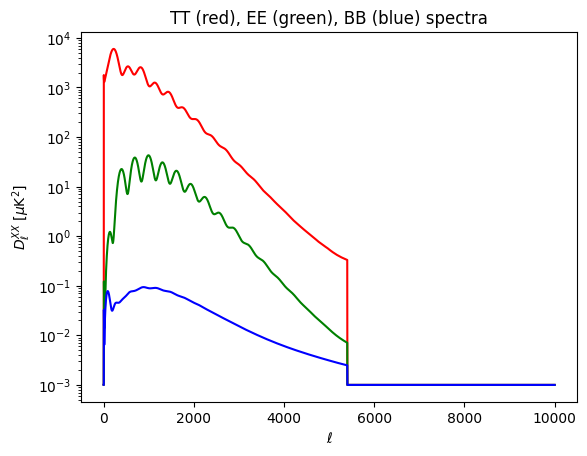

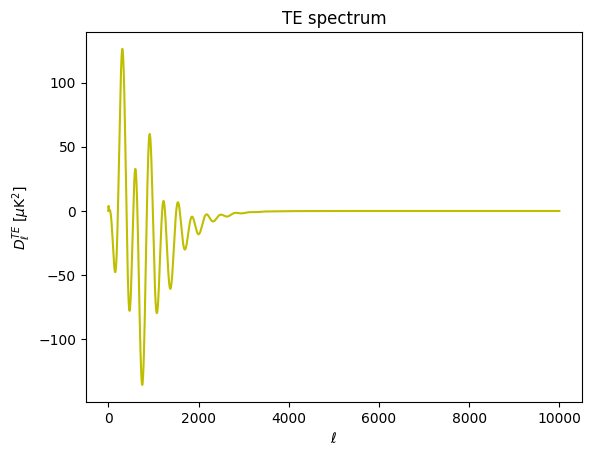

In [3]:
nbig = 10000
# read in the input CMB spectra
ell, DlTT,DlEE,DlBB, DlTE= np.loadtxt("CMB_fiducial_totalCls.dat", usecols=(0, 1,2,3,4), unpack=True) 

ell_big = np.arange(nbig)
DlTT_big = np.zeros(nbig)
DlTT_big[ell.astype(int)] = DlTT
DlEE_big = np.zeros(nbig)
DlEE_big[ell.astype(int)] = DlEE
DlBB_big = np.zeros(nbig)
DlBB_big[ell.astype(int)] = DlBB
DlTE_big = np.zeros(nbig)
DlTE_big[ell.astype(int)] = DlTE

ell = ell_big
DlTT = DlTT_big + 1e-3   ### the 1e-3 factor maps plotting easy
DlEE = DlEE_big + 1e-3
DlBB = DlBB_big + 1e-3
DlTE = DlTE_big

#Adding point source spectra, which are not part of the fiducial cosmology
Temp_point_source_spectrum = DlTT[3000]*(ell/3000.)**2.
Pol_point_source_spectrum = DlEE[4500]*(ell/4500.)**2.

DlTT_PS = DlTT + Temp_point_source_spectrum
DlEE_PS = DlEE + Pol_point_source_spectrum
DlBB_PS = DlBB + Pol_point_source_spectrum

plt.semilogy(ell,DlTT,'r')
plt.semilogy(ell,DlEE,'g')
plt.semilogy(ell,DlBB,'b')
plt.title('TT (red), EE (green), BB (blue) spectra')
plt.ylabel(r'$D^{XX}_{\ell}$ [$\mu$K$^2$]')
plt.xlabel(r'$\ell$')
plt.show()

plt.plot(ell,DlTE,'y')
plt.ylabel(r'$D^{TE}_{\ell}$ [$\mu$K$^2$]')
plt.xlabel(r'$\ell$')
plt.title('TE spectrum')
plt.show()

These spectra probably look familiar to you. If you wish to explore the cosmological dependence of these spectra, you can simulate these spectra using CAMB on the NASA Lambda website, just as we did in the `Simulating the CMB` notebook. A key aspect for simulation and analysis is that the information in the TT, EE, and BB spectra is entirely contained in the T, E, and B maps, respectively; while the TE information is contained within the T and E maps through a partial correlation that comes about from how the T and E fluctuations are sourced in the early universe. We will have to build in this correlation when we simulate the triplet of T, E, and B maps.

## Simulate T, E, and B maps

Here, we introduce a function to create T, Q, and U maps. To do this, we follow the same procedure that we introduced in `Simulating the CMB` to create T, E, and B maps, also introducing CMB correlations. We then transform into Q and U maps.

The correlation is introduced by (1) generating Gaussian random fields for the T, B, and uncorrelated part of the E maps; (2) separating the E-mode spectrum into a piece that is correlated with T: 
$$C_\ell^{EE, correlated} = r^2_\ell C_\ell^{TT} $$ 
where $$r_\ell = \frac {(C_\ell^{TE})} {\sqrt{C_\ell^{EE}C_\ell^{TT}}},$$ and a part that has represents the amplitude of the uncorrelated fluctuations (chosen such that the correlated and uncorelated E- fluctuations reproduce the EE spectrum: $$C_\ell^{uncorrelated} = (1-r^2_\ell) C_\ell^{EE};$$ and then generating the E- map as a sum of realizations of these two pieces.
NOTE: You may understand and derive this result by reading about [Cholesky decomposition](https://en.wikipedia.org/wiki/Cholesky_decomposition).

The relation between E-B and Q-U maps is given by a position-dependent rotation in Fourier space.  We introduce an angle $\psi= \arctan \frac {k_Y} {k_X}$, where $k_X$ and $k_Y$ are the wave numbers in fourier space. With this angle, the relation between E-B and Q-U is:
$$\tilde Q  = \tilde E \cos 2 \psi - \tilde B \sin 2 \psi$$
$$\tilde U  = \tilde E \sin 2 \psi + \tilde B \cos 2 \psi$$

The ~ over the Q, U, E, and B are to remind you that these quantities are in Fourier space.  

As this is a simple rotation, the inverse trasnformation is:
$$\tilde E  = \tilde Q \cos 2 \psi + \tilde U \sin 2 \psi$$
$$\tilde B  = -\tilde Q \sin 2 \psi + \tilde U \cos 2 \psi$$

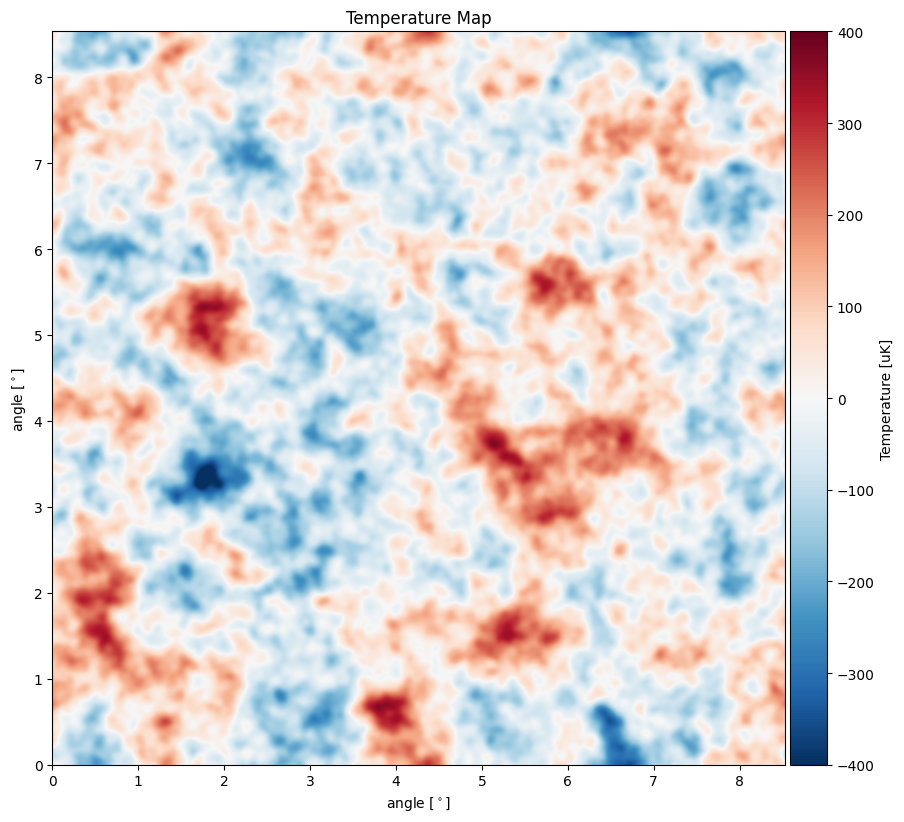

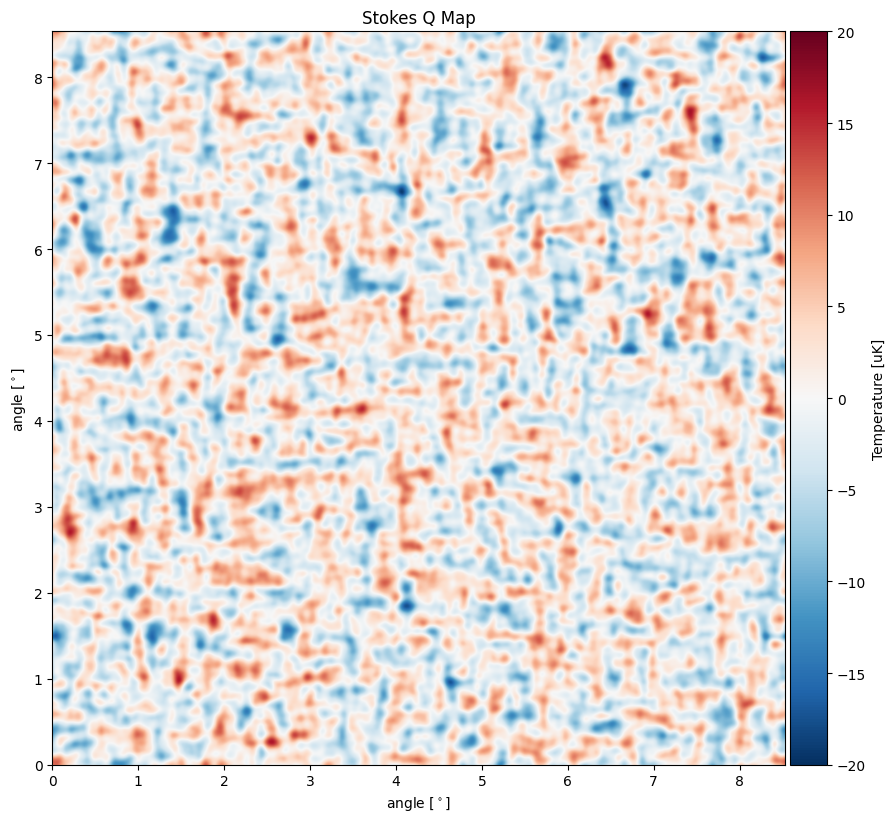

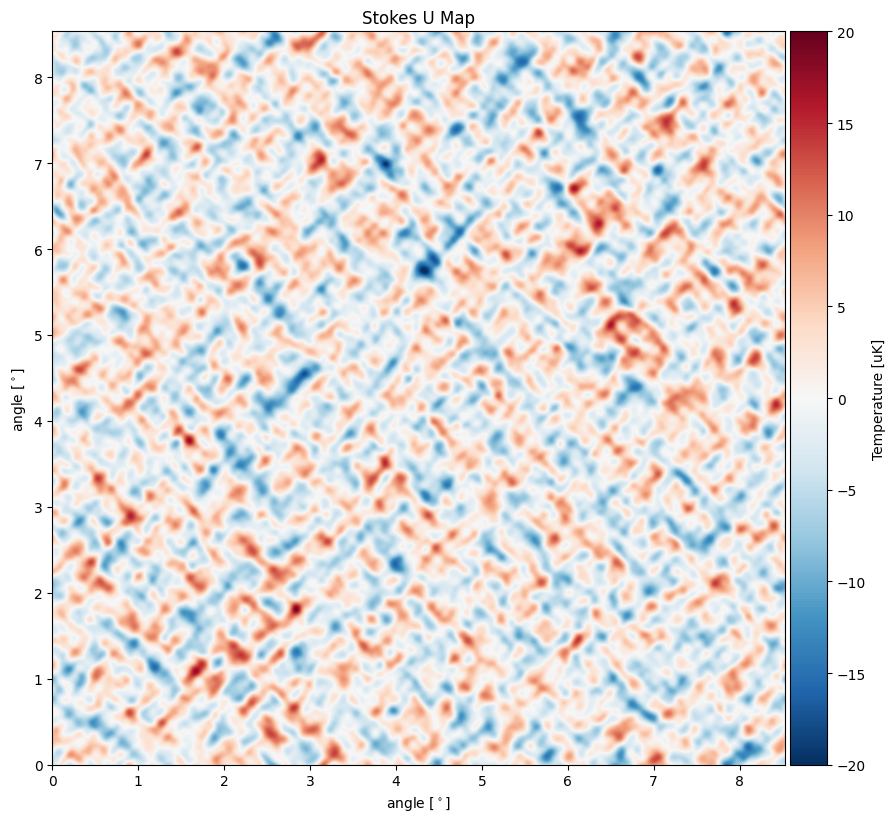

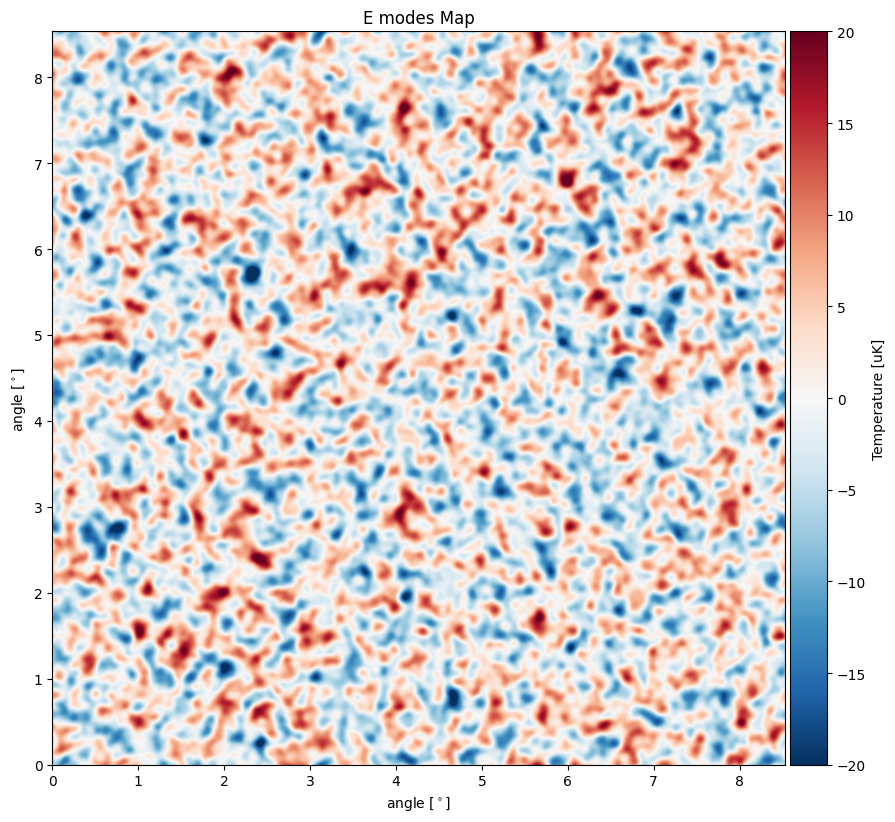

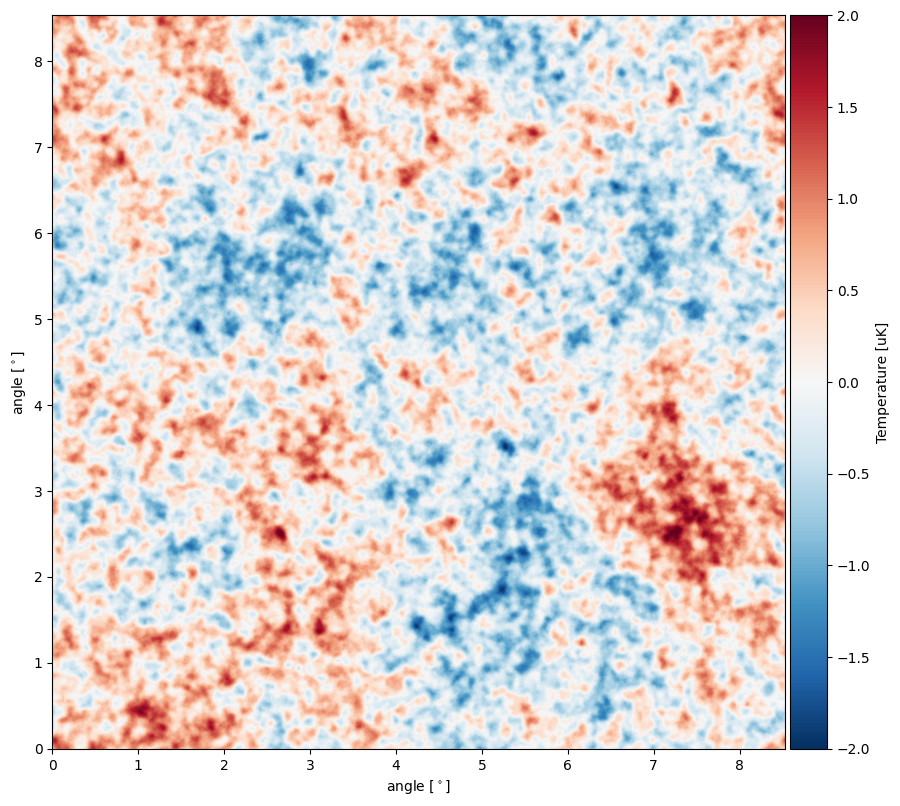

In [4]:
def make_CMB_maps(N,pix_size,ell,DlTT,DlEE,DlTE,DlBB):
    "makes a realization of a simulated CMB sky map"

    # convert Dl to Cl, we use np.divide to avoid dividing by zero.
    dell = ell * (ell + 1) / 2 / np.pi
    ClTT = np.divide(DlTT, dell, where=ell>1, out=None)
    ClEE = np.divide(DlEE, dell, where=ell>1, out=None)
    ClTE = np.divide(DlTE, dell, where=ell>1, out=None)
    ClBB = np.divide(DlBB, dell, where=ell>1, out=None)
    
    # set the \ell = 0 and \ell =1 modes to zero, as these are unmeasurable and blow up with the above transform
    ClTT[0:2] = 0.
    ClEE[0:2] = 0.
    ClTE[0:2] = 0.
    ClBB[0:2] = 0.

    # separate the correlated and uncorrelated part of the EE spectrum
    correlated_part_of_E = np.divide(ClTE, np.sqrt(ClTT), where=ell>1, out=None)
    uncorrelated_part_of_EE = ClEE - np.divide(ClTE**2., ClTT, where=ell>1, out=None)
    
    correlated_part_of_E[0:2] = 0.
    uncorrelated_part_of_EE[0:2] = 0.
    
    # make a 2d coordinate system
    ones = np.ones(N)
    inds  = (np.arange(N) - N/2.) /(N-1.)
    X = np.outer(ones,inds)
    Y = np.transpose(X)
    R = np.sqrt(X**2. + Y**2.)
    ang = np.arctan2(Y,X)   ## we now need this angle to handle the EB <--> QU rotation
    
    # now make a set of 2d CMB masks for the T, E, and B maps
    ell_scale_factor = 2. * np.pi / (pix_size/60. * np.pi/180.)
    ell2d = R * ell_scale_factor
    ClTT_expanded = np.zeros(int(ell2d.max())+1)
    ClTT_expanded[0:(ClTT.size)] = ClTT
    ClEE_uncor_expanded = np.zeros(int(ell2d.max())+1)
    ClEE_uncor_expanded[0:(uncorrelated_part_of_EE.size)] = uncorrelated_part_of_EE
    ClE_corr_expanded = np.zeros(int(ell2d.max())+1)
    ClE_corr_expanded[0:(correlated_part_of_E.size)] = correlated_part_of_E
    ClBB_expanded = np.zeros(int(ell2d.max())+1)
    ClBB_expanded[0:(ClBB.size)] = ClBB
    CLTT2d = ClTT_expanded[ell2d.astype(int)]
    ClEE_uncor_2d = ClEE_uncor_expanded[ell2d.astype(int)]
    ClE_corr2d = ClE_corr_expanded[ell2d.astype(int)]
    CLBB2d = ClBB_expanded[ell2d.astype(int)]
    
    # now make a set of Gaussian random fields that will be turned into the CMB maps
    randomn_array_for_T = np.fft.fft2(np.random.normal(0,1,(N,N)))
    randomn_array_for_E = np.fft.fft2(np.random.normal(0,1,(N,N))) 
    randomn_array_for_B = np.fft.fft2(np.random.normal(0,1,(N,N))) 
    
    ## make the T, E, and B maps by multiplying the masks against the random fields
    FT_2d = np.sqrt(CLTT2d) * randomn_array_for_T
    FE_2d = np.sqrt(ClEE_uncor_2d) * randomn_array_for_E + ClE_corr2d* randomn_array_for_T
    FB_2d = np.sqrt(CLBB2d) * randomn_array_for_B
    
    ## now convert E and B to Q and U
    FQ_2d = FE_2d* np.cos(2.*ang) - FB_2d * np.sin(2. *ang)
    FU_2d = FE_2d* np.sin(2.*ang) + FB_2d * np.cos(2. *ang)
    
    ## convert from Fourier space to real space
    CMB_T = np.fft.ifft2(np.fft.fftshift(FT_2d)) /(pix_size /60.* np.pi/180.)
    CMB_T = np.real(CMB_T)
    CMB_Q = np.fft.ifft2(np.fft.fftshift(FQ_2d)) /(pix_size /60.* np.pi/180.)
    CMB_Q = np.real(CMB_Q)
    CMB_U = np.fft.ifft2(np.fft.fftshift(FU_2d)) /(pix_size /60.* np.pi/180.)
    CMB_U = np.real(CMB_U)

    ## optional code for spitting out E and B maps 
    CMB_E = np.fft.ifft2(np.fft.fftshift(FE_2d)) /(pix_size /60.* np.pi/180.)
    CMB_E = np.real(CMB_E)
    CMB_B = np.fft.ifft2(np.fft.fftshift(FB_2d)) /(pix_size /60.* np.pi/180.)
    CMB_B = np.real(CMB_B)
    
    ## return the maps
    return(CMB_T,CMB_Q,CMB_U,CMB_E,CMB_B)
  ###############################
    
## make a CMB T map
CMB_T,CMB_Q,CMB_U,CMB_E,CMB_B = make_CMB_maps(N,pix_size,ell,DlTT,DlEE,DlTE,DlBB)

p = cmb_modules.Plot_CMB_Map(CMB_T,c_min,c_max,X_width,Y_width, title="Temperature Map")
p = cmb_modules.Plot_CMB_Map(CMB_Q,c_min/20.,c_max/20.,X_width,Y_width, title="Stokes Q Map")
p = cmb_modules.Plot_CMB_Map(CMB_U,c_min/20.,c_max/20.,X_width,Y_width, title="Stokes U Map")
p = cmb_modules.Plot_CMB_Map(CMB_E,c_min/20.,c_max/20.,X_width,Y_width, title="E modes Map")
p = cmb_modules.Plot_CMB_Map(CMB_B,c_min/200.,c_max/200.,X_width,Y_width)

In [5]:
print(np.std(CMB_T))
print(np.std(CMB_Q))
print(np.std(CMB_U))

103.35623412221686
4.533199588397725
4.567843019568339


Note the RMS of these maps: the T is ~100 $\mu$K, the Q and U are ~ 4.5 $\mu$K, the E is ~ 6.5 $\mu$K, and the B map rms is $<1 \mu K$.  Knowing these values is a good useful starting point for debuging simulations, calibration of real maps, and tracking the impact of filtering on maps.

<font color='red'>EXERCISE: </font>  Add point sources and the SZ to these maps, next convolve with a beam, and add instrumental noise.   Assume the point sources have a fixed $3\%$ polarization fraction with random polarization angles and the SZ is fully unpolarized.  The noise in the polarization maps is $\sqrt 2$ larger than the temperature noise.

Number of sources required:  5000
CMB_T shape: (1024, 1024)
T_point_source shape: (1024, 1024)
SZ_map shape: (1024, 1024)
noise_T shape: (1024, 1024)


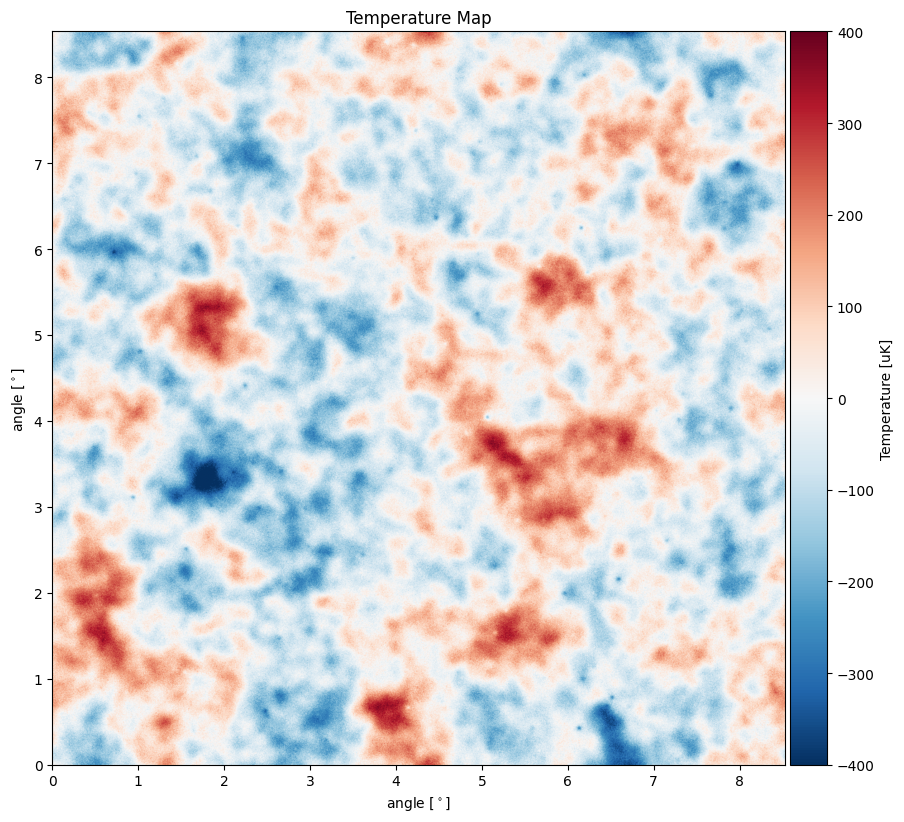

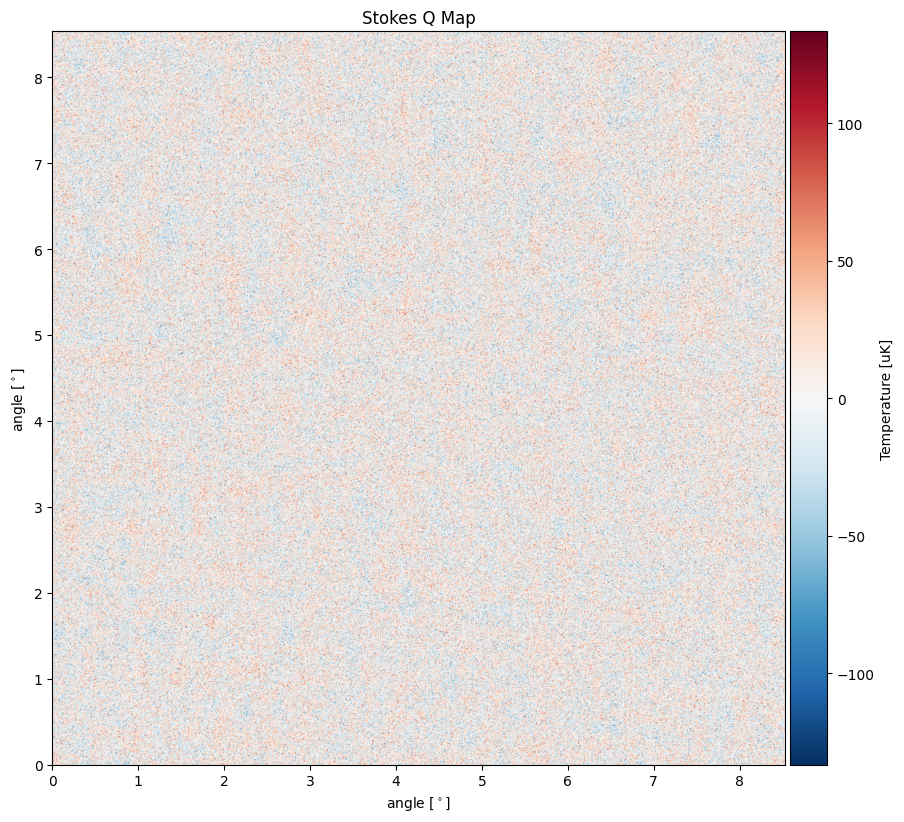

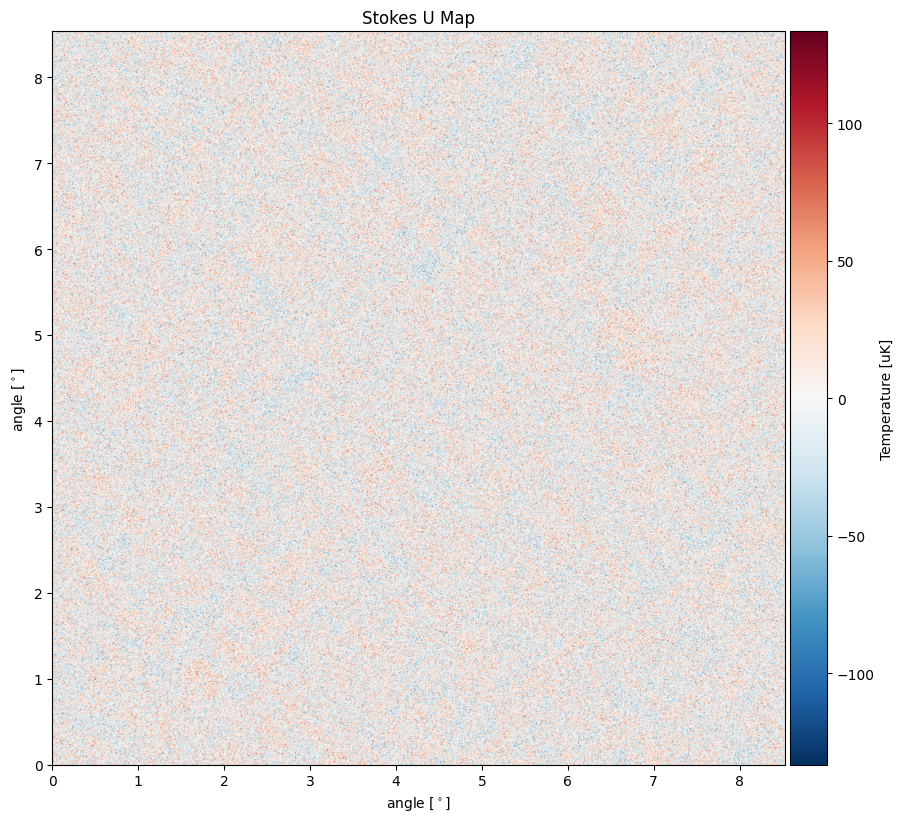

In [6]:
# Ensure all auxiliary maps have the same shape as CMB_T before combining
fwhm_pix = 1.25
# Generate Poisson-distributed point sources (T, Q, U)
T_point_source = cmb_modules.Poisson_source_component(N, pix_size, Number_of_Sources, Amplitude_of_Sources)
polarized_fraction = 0.03 # P = sqrt(Q^2 + U^2) / T
# Generate random polarization angles
psi_point_source = np.random.uniform(low=0, high=2 * np.pi, size=(N, N))
Q_point_source = polarized_fraction * T_point_source * np.cos(2 * psi_point_source)
U_point_source = polarized_fraction * T_point_source * np.sin(2 * psi_point_source)

# Generate SZ component (should return map of shape [N, N])
sz_result = cmb_modules.SZ_source_component(
    N, pix_size, Number_of_SZ_Clusters, Mean_Amplitude_of_SZ_Clusters, SZ_beta, SZ_Theta_core, do_plots=False
)

SZ_map = sz_result[0]
# Ensure SZ_map is the map, not a tuple
# if isinstance(sz_result, tuple):
#     SZ_map = sz_result[0]
# else:
#     SZ_map = sz_result

# Generate noise (should return [N, N])
noise_T = cmb_modules.make_noise_map(N, pix_size, white_noise_level, atmospheric_noise_level, one_over_f_noise_level)
noise_Q = np.sqrt(2) * noise_T
noise_U = np.sqrt(2) * noise_T

# Print shapes for debug
print("CMB_T shape:", CMB_T.shape)
print("T_point_source shape:", T_point_source.shape)
print("SZ_map shape:", SZ_map.shape)
print("noise_T shape:", noise_T.shape)

# Make sure everything is the same array shape before adding
assert CMB_T.shape == T_point_source.shape == SZ_map.shape == noise_T.shape, "Shape mismatch in T components"
assert CMB_Q.shape == Q_point_source.shape == noise_Q.shape, "Shape mismatch in Q components"
assert CMB_U.shape == U_point_source.shape == noise_U.shape, "Shape mismatch in U components"

total_T = cmb_modules.convolve_map_with_gaussian_beam(N,pix_size,fwhm_pix,CMB_T + T_point_source + SZ_map) + noise_T
total_Q = cmb_modules.convolve_map_with_gaussian_beam(N,pix_size,fwhm_pix,CMB_Q + Q_point_source) + noise_Q
total_U = cmb_modules.convolve_map_with_gaussian_beam(N,pix_size,fwhm_pix,CMB_U + U_point_source) + noise_U

p = cmb_modules.Plot_CMB_Map(total_T, c_min, c_max, X_width, Y_width, title="Temperature Map")
p = cmb_modules.Plot_CMB_Map(total_Q, c_min/3., c_max/3., X_width, Y_width, title="Stokes Q Map")
p = cmb_modules.Plot_CMB_Map(total_U, c_min/3., c_max/3., X_width, Y_width, title="Stokes U Map")

In [7]:
print(np.std(total_Q))
print(np.std(total_U))
print(np.std(total_T))


28.644809239645742
28.64450921764023
105.50085154464016


## Directly visualize the polarization field

In the above, we have visualized the polarization field using two different methods: a decomposition into Stokes Q and U maps (these are quantities that we observe), and a decomposition into E- and B-modes. Sometimes it is useful to instead visualize the polarization field as a vector field of (headless) vectors that directly show the orientation and amplitude of the (linearly) polarized light.

Below we generate a plot like this using vectors of length $p = \sqrt{Q^2 + U^2}$ and orientation $\psi_p$ given by $2 \psi_p = \arctan\left( \frac{U}{Q}\right)$. We overlay this plot on the E-mode map to demonstrate that the polarization field (which is dominated by E-modes) closely traces this map.

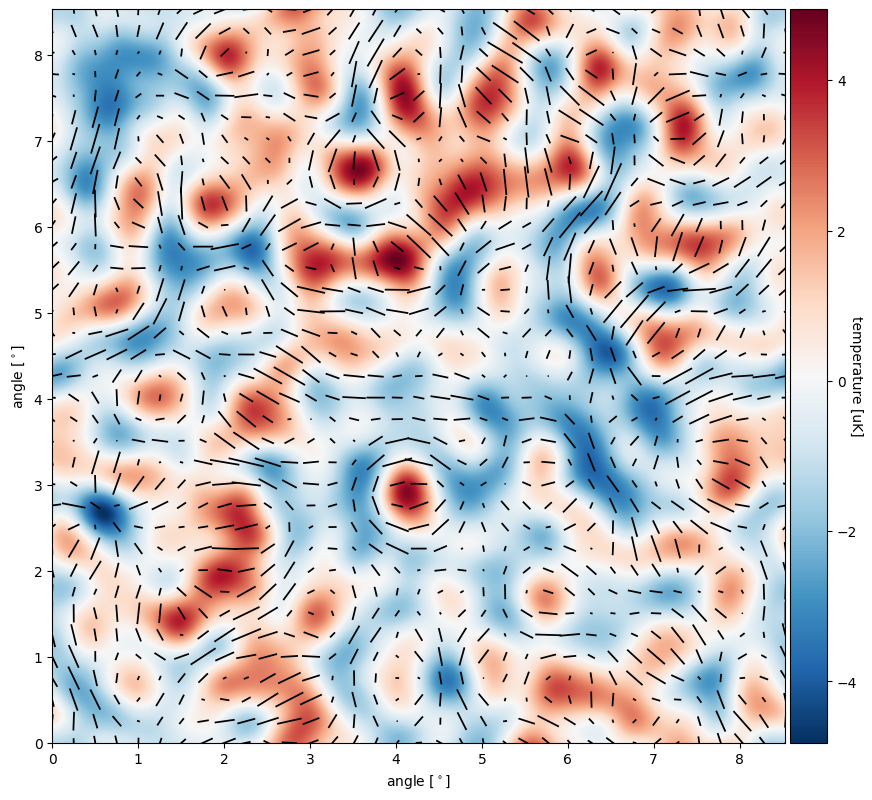

In [8]:
def plot_quiver(Q, U, X_width, Y_width, background=None):
    '''Visualize Stokes Q, U as headless vectors'''
    from mpl_toolkits.axes_grid1 import make_axes_locatable
    
    # Smooth maps for nicer images
    fwhm_pix = 30
    Q = cmb_modules.convolve_map_with_gaussian_beam(N,pix_size,fwhm_pix,Q)
    U = cmb_modules.convolve_map_with_gaussian_beam(N,pix_size,fwhm_pix,U)
    if background is not None:
        # If provided, we overplot the vectors on top of the smoothed background.
        background = cmb_modules.convolve_map_with_gaussian_beam(N,pix_size,fwhm_pix,background)
    
    Q = Q[::int(fwhm_pix),::int(fwhm_pix)]
    U = U[::int(fwhm_pix),::int(fwhm_pix)]
    
    p_amp = np.sqrt(Q**2 + U**2)
    ang = np.arctan2(U, Q) / 2.
    
    u = p_amp * np.cos(ang)
    v = p_amp * np.sin(ang)

    x = np.linspace(0,X_width,u.shape[1])
    y = np.linspace(0,X_width,u.shape[0])    
        
    fig, ax = plt.subplots(figsize=(10,10))
    if background is not None:
        im = ax.imshow(background, interpolation='bilinear', origin='lower',cmap=cm.RdBu_r,
                       extent=([0,X_width,0,Y_width]))
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        cbar = plt.colorbar(im, cax=cax)
        cbar.set_label('temperature [uK]', rotation=270)
        
    ax.quiver(x, y, u, v, headwidth=1, headlength=0, pivot='mid', units='xy',
              scale_units='xy', scale=2 * p_amp.max(), linewidth=1)
        
    ax.set_ylabel(r'angle $[^\circ]$')
    ax.set_xlabel(r'angle $[^\circ]$')
    
    plt.show(fig)

plot_quiver(CMB_Q,CMB_U,X_width,Y_width,background=CMB_E)

<font color='red'>EXERCISE: </font>  Generate a polarization field dominated by B-mode polarization and plot the polarization vectors on top of the B-mode map. What is the difference between the E-mode field and the B-mode field?

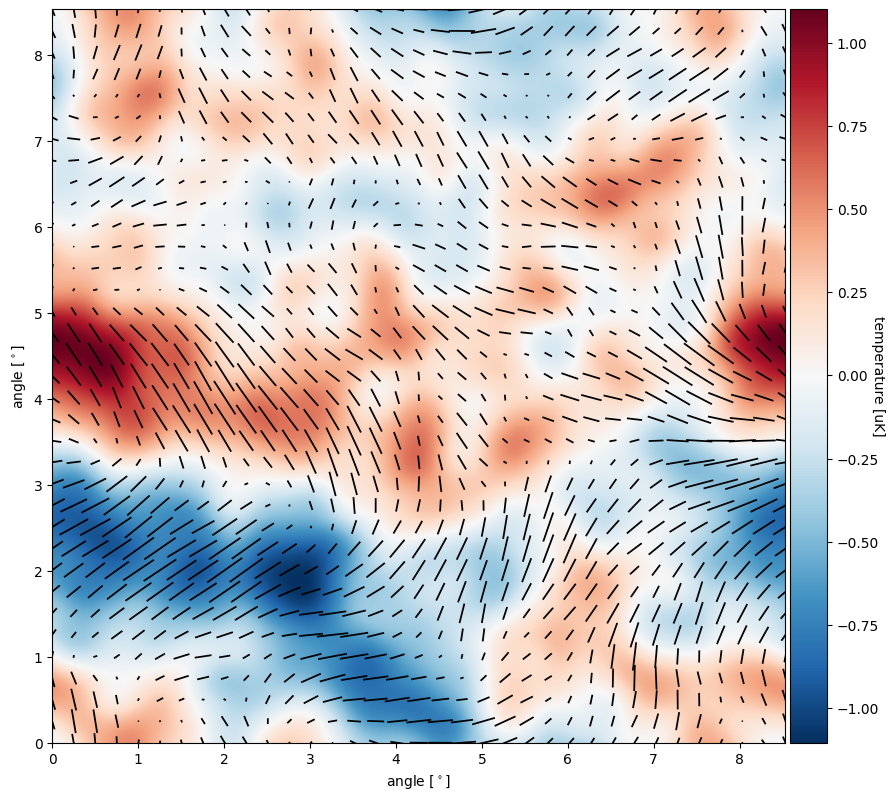

In [9]:
# ## your code goes here
Dl_TT_new = np.zeros(len(ell)) + 1e-3 
Dl_EE_new = np.zeros(len(ell)) 
Dl_TE_new = np.zeros(len(ell))

CMB_T_noE,CMB_Q_noE,CMB_U_noE,CMB_E_noE,CMB_B_noE = make_CMB_maps(N,pix_size,ell,Dl_TT_new,Dl_EE_new,Dl_TE_new,DlBB)

plot_quiver(CMB_Q_noE,CMB_U_noE,X_width,Y_width,background=CMB_B_noE)



<font color='red'>EXERCISE: </font>  Calculate the BB power spectrum using the techniques we explored in the `Power Spectrum Analysis` notebook. Compare your results to the input spectra. Make sure to include a window (i.e. pixel mask).  

<font color='red'>hint: </font> You can make use of the `QU2EB()` function below to convert Q and U maps to E and B maps. Because real data would be provided as Q and U maps, a pixel mask should be applied to the Q and U maps before converting to E and B.

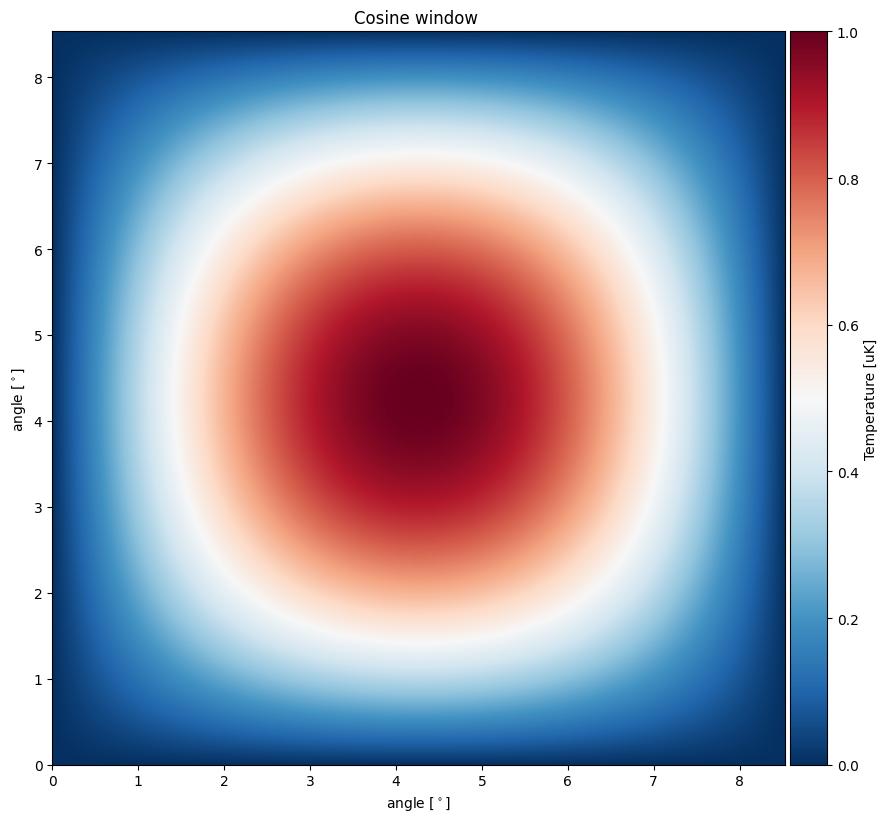

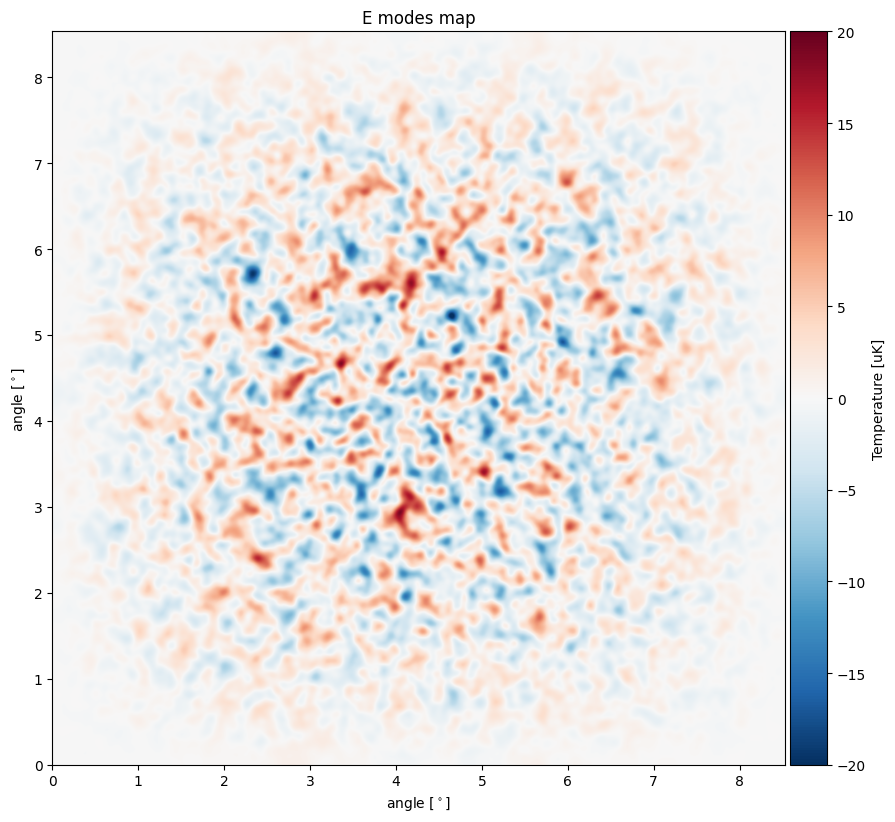

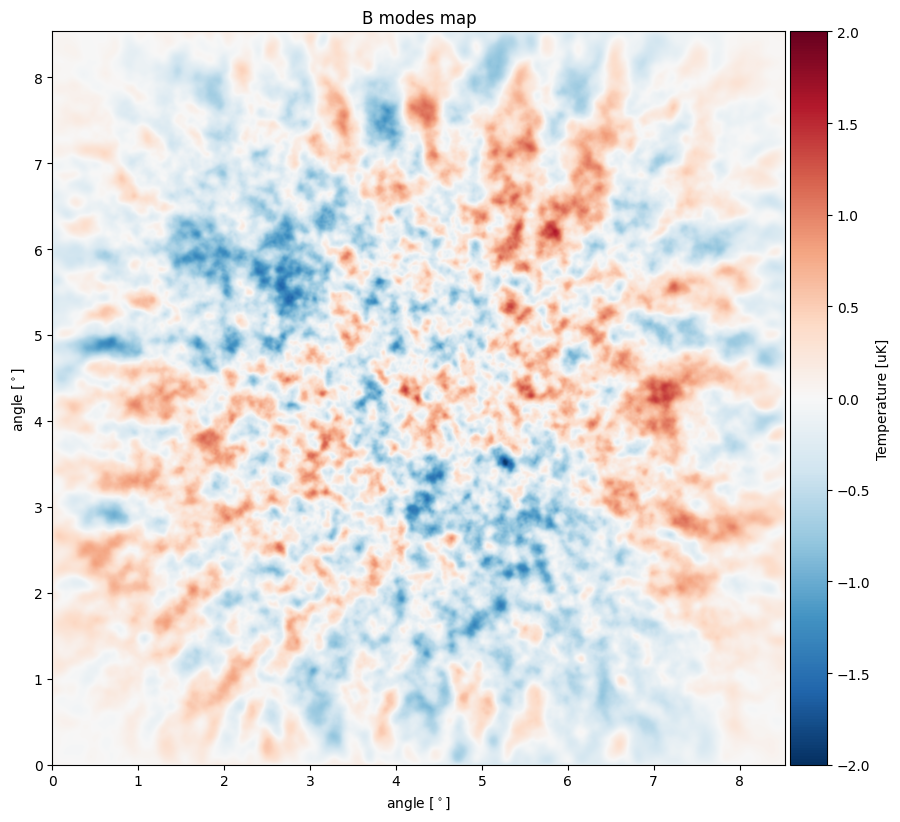

In [10]:
def QU2EB(N,pix_size,Qmap,Umap,):
    '''Calcalute E, B maps given input Stokes Q, U maps'''
    
    # Create 2d Fourier coordinate system.
    ones = np.ones(N)
    inds  = (np.arange(N) - N/2.) /(N-1.)
    kX = np.outer(ones,inds) / (pix_size/60. * np.pi/180.)
    kY = np.transpose(kX)
    ang = np.arctan2(kY,kX)
  
    # Convert to Fourier domain.
    fQ = np.fft.fftshift(np.fft.fft2(Qmap))
    fU = np.fft.fftshift(np.fft.fft2(Umap))
    
    # Convert Q, U to E, B in Fourier domain.
    fE = fQ * np.cos(2.*ang) + fU * np.sin(2. *ang)
    fB = - fQ * np.sin(2.*ang) + fU * np.cos(2. *ang)
    
    # Convert E, B from Fourier to real space.
    Emap = np.real(np.fft.ifft2(np.fft.fftshift(fE)))
    Bmap = np.real(np.fft.ifft2(np.fft.fftshift(fB)))

    return Emap, Bmap

# Convert masked Q, U to E and B.
Emap, Bmap = QU2EB(N,pix_size,CMB_Q * window,CMB_U * window)

cmb_modules.Plot_CMB_Map(window,0,1,X_width,Y_width, title="Cosine window ")
cmb_modules.Plot_CMB_Map(Emap,-20,20,X_width,Y_width, title="E modes map")
cmb_modules.Plot_CMB_Map(Bmap,-2,2,X_width,Y_width, title="B modes map")

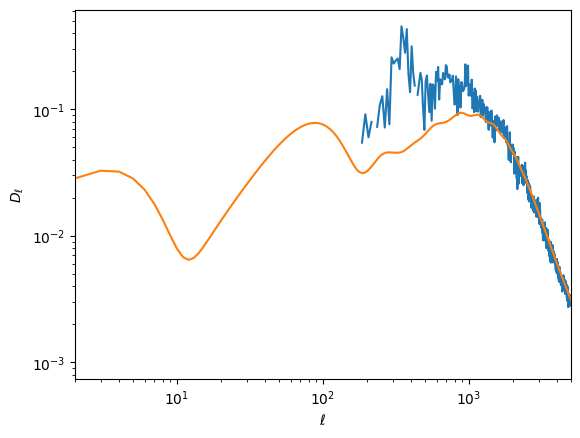

array([       nan,        nan, 0.01812181,        nan,        nan,
              nan, 0.08889128,        nan, 0.21742589,        nan,
       0.08713796,        nan, 0.08040911,        nan, 0.09571189,
              nan, 0.11272415,        nan, 0.05453681, 0.09142727,
       0.06015868, 0.07959624,        nan, 0.07275529, 0.10826568,
       0.12704905, 0.07176278, 0.14440538, 0.07621289, 0.25780443,
       0.23016066, 0.24271435, 0.25249991, 0.208038  , 0.45325388,
       0.36798185, 0.28032371, 0.43137315, 0.19101973, 0.13686765,
       0.31492015, 0.19409058, 0.15418108,        nan, 0.13028008,
       0.16101187, 0.19411992, 0.17161561, 0.10159239, 0.0687988 ,
       0.16619601, 0.18477625, 0.1332103 , 0.0950929 , 0.15913296,
       0.08125607, 0.15740234, 0.15391307, 0.10118419, 0.19788289,
       0.16871417, 0.21634291, 0.11958451, 0.17280464, 0.16306999,
       0.15764732, 0.19381134, 0.17902034, 0.17286662, 0.22379589,
       0.21720968, 0.17884909, 0.17859819, 0.1884936 , 0.16356

In [25]:
## your code goes here
fsky = cmb_modules.get_fsky(pix_size, N, window)
ell_max = 5000
ell_bins = np.arange(2, ell_max, 10)
delta_ell = ell_bins[1] - ell_bins[0]
ell_plot, C_ell_BB = cmb_modules.calculate_2d_spectrum(Bmap,Bmap,delta_ell,ell_max,pix_size,N)
D_ell_BB = C_ell_BB * ell_bins * (ell_bins + 1) / (2 * np.pi) / fsky
plt.plot(ell_plot, D_ell_BB)
plt.plot(ell, DlBB)
plt.xlabel(r'$\ell$')
plt.ylabel(r'$D_\ell$')
plt.xscale('log')
plt.yscale('log')
plt.xlim(2, 5000)
plt.show()

D_ell_BB


#### Your discussion goes here

<font color='red'>EXERCISE: </font>  Create a simulated map with $C_\ell^{BB} = 0$. Make a hole in the Q and U map (for instance using the `hole` function in the next cell), and get the E modes and B modes maps of these new Q/U maps. What do you see in the B-modes map ? What does the BB power spectrum looks like ?

In [27]:
Dl_BB_new = np.zeros_like(DlBB)
CMB_T_noE,CMB_Q_noE,CMB_U_noE,CMB_E_noE,CMB_B_noE = make_CMB_maps(N,pix_size,ell,DlTT,DlEE,DlTE,Dl_BB_new)

In [12]:
def hole(pos=[300, 300], radius=50, size=N):
    mask = np.ones((size, size))
    for i in range(size):
        for j in range(size):
            dist_from_hole = np.sqrt((pos[0]-i)**2 + (pos[1]-j)**2)
            if dist_from_hole < radius:
                mask[i, j] = 1 - np.cos(dist_from_hole / radius * np.pi / 2)
    return mask

In [ ]:
hole_mask = hole()


(1024, 1024)

In actual CMB experiments, we estimate E modes and B modes from masked Q and U maps, so we need to correct from this effect.

#### Your discussion goes here

<font color='red'>EXERCISE: </font>  Calculate the TE power spectrum by adapting the techniques from the `Power Spectrum Analysis` notebook.

In [13]:
## your code goes here

#### Your discussion goes here

## Kendrick Smith's no-leak B-mode estimator

Kendrick Smith wrote a nice <a href=https://arxiv.org/abs/astro-ph/0511629>paper</a> describing his solution to the E-B mixing problem on cut skies. He showed that the leakage is related to the window function used to apodize the maps before moving to Fourier space and identified corrections (products of the derivatives of the window function and the Q and U maps in Fourier space) that can be added to create a clean estimate of the B-modes.

We implement his method here so that you can apply it to your simulations and see that it cleans up the B-mode estimate you produced above.

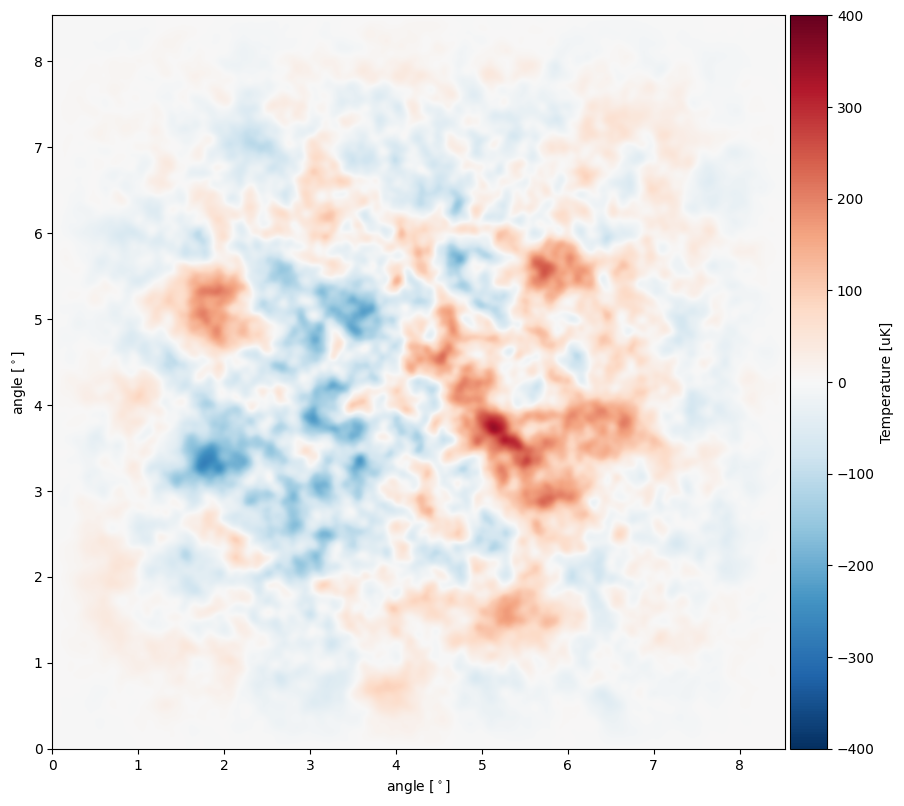

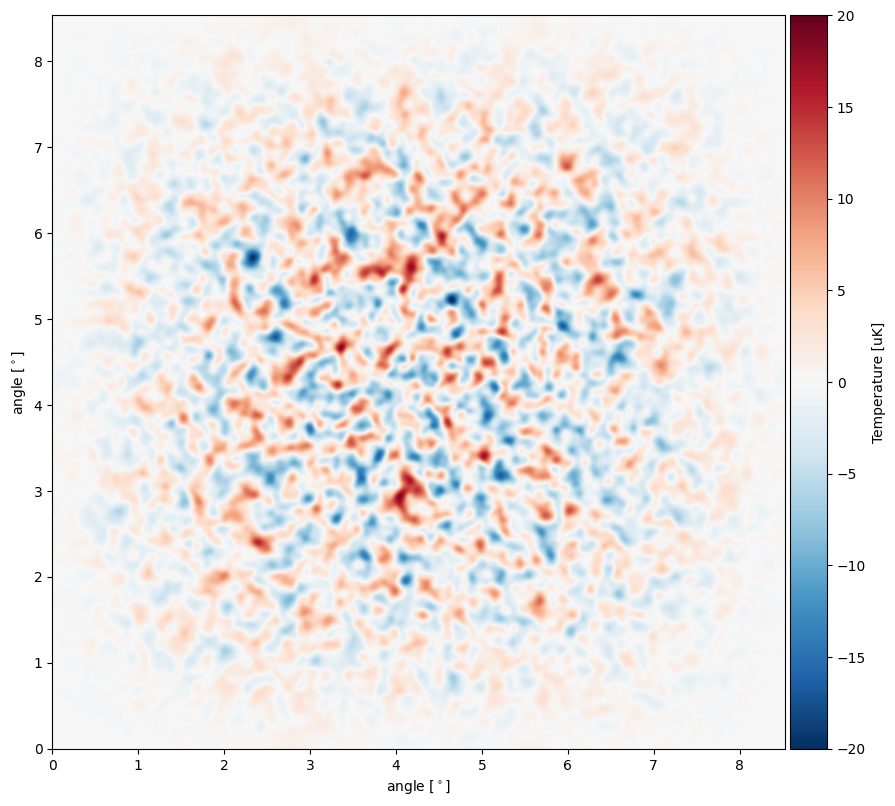

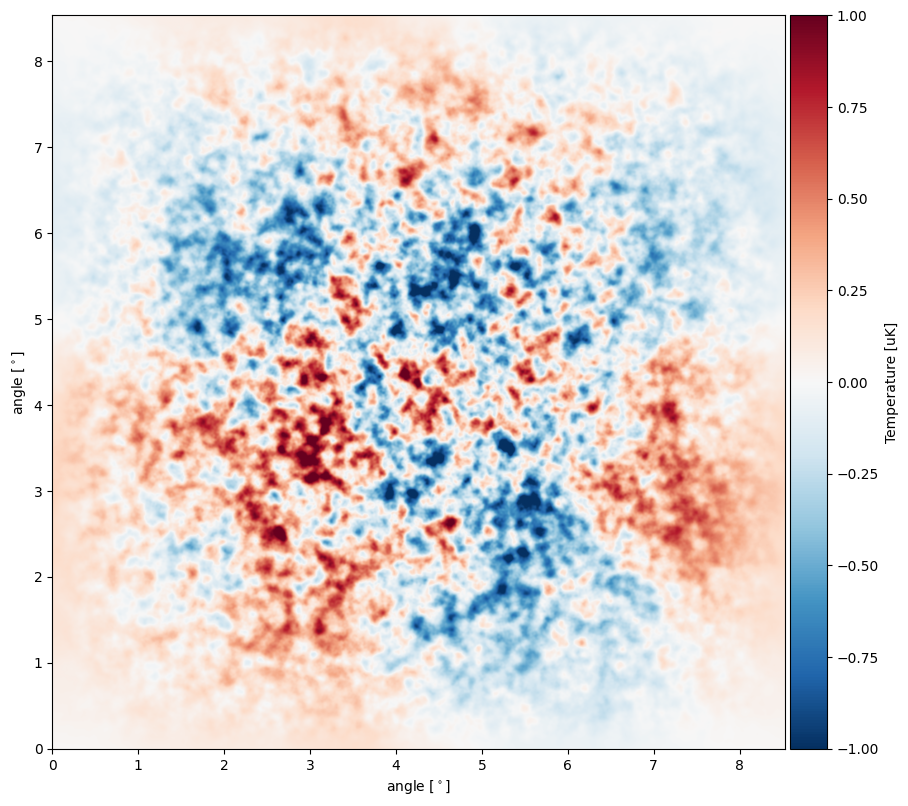

In [14]:
def kendric_method_precompute_window_derivitives(win,pix_size):
    delta = pix_size * np.pi /180. /60.
    dwin_dx =    ((-1.) * np.roll(win,-2,axis =1)      +8. * np.roll(win,-1,axis =1)     - 8. *np.roll(win,1,axis =1)      +np.roll(win,2,axis =1) ) / (12. *delta)
    dwin_dy =    ((-1.) * np.roll(win,-2,axis =0)      +8. * np.roll(win,-1,axis =0)     - 8. *np.roll(win,1,axis =0)      +np.roll(win,2,axis =0) ) / (12. *delta)
    d2win_dx2 =  ((-1.) * np.roll(dwin_dx,-2,axis =1)  +8. * np.roll(dwin_dx,-1,axis =1) - 8. *np.roll(dwin_dx,1,axis =1)  +np.roll(dwin_dx,2,axis =1) ) / (12. *delta)
    d2win_dy2 =  ((-1.) * np.roll(dwin_dy,-2,axis =0)  +8. * np.roll(dwin_dy,-1,axis =0) - 8. *np.roll(dwin_dy,1,axis =0)  +np.roll(dwin_dy,2,axis =0) ) / (12. *delta)
    d2win_dxdy = ((-1.) * np.roll(dwin_dy,-2,axis =1)  +8. * np.roll(dwin_dy,-1,axis =1) - 8. *np.roll(dwin_dy,1,axis =1)  +np.roll(dwin_dy,2,axis =1) ) / (12. *delta)
    return(dwin_dx,dwin_dy,d2win_dx2,d2win_dy2,d2win_dxdy)

def kendrick_method_TQU_to_fourier_TEB(N,pix_size,Tmap,Qmap,Umap,window,dwin_dx,dwin_dy,d2win_dx2,d2win_dy2,d2win_dxdy):
    ### the obvious FFTs
    fft_TxW = np.fft.fftshift(np.fft.fft2(Tmap * window))
    fft_QxW = np.fft.fftshift(np.fft.fft2(Qmap * window))
    fft_UxW = np.fft.fftshift(np.fft.fft2(Umap * window))

    ### the less obvious FFTs that go into the no-leak estiamte
    fft_QxdW_dx = np.fft.fftshift(np.fft.fft2(Qmap * dwin_dx))
    fft_QxdW_dy = np.fft.fftshift(np.fft.fft2(Qmap * dwin_dy))
    fft_UxdW_dx = np.fft.fftshift(np.fft.fft2(Umap * dwin_dx))
    fft_UxdW_dy = np.fft.fftshift(np.fft.fft2(Umap * dwin_dy))
    fft_QU_HOT  = np.fft.fftshift(np.fft.fft2( (2. * Qmap * d2win_dxdy) + Umap * (d2win_dy2 - d2win_dx2) ))
    
    ### generate the polar coordinates needed to cary out the EB-QU conversion
    ones = np.ones(N)
    inds  = (np.arange(N) - N/2.) /(N-1.)
    X = np.outer(ones,inds)
    Y = np.transpose(X)
    R = np.sqrt(X**2. + Y**2. + 1e-9)  ## the small offset regularizes the 1/ell factors below
    ang =  np.arctan2(Y,X)
    ell_scale_factor = 2. * np.pi / (pix_size/60. * np.pi/180.)
    ell2d = R * ell_scale_factor
        
    #p=Plot_CMB_Map(np.real( ang),-np.pi,np.pi,N,N)
    
    ### now compute the estimator
    fTmap = fft_TxW
    fEmap = fft_QxW * np.cos(2. * ang) + fft_UxW * np.sin(2. * ang)
    fBmap = (fft_QxW * (-1. *np.sin(2. * ang)) + fft_UxW * np.cos(2. * ang))  ## this line is the nominal B estimator
    fBmap = fBmap - complex(0,2.) / ell2d * (fft_QxdW_dx * np.sin(ang) + fft_QxdW_dy * np.cos(ang))
    fBmap = fBmap - complex(0,2.) / ell2d * (fft_UxdW_dy * np.sin(ang) - fft_UxdW_dx * np.cos(ang))
    fBmap = fBmap +  ell2d**(-2.) * fft_QU_HOT

    ### return the complex fourier maps in 2d
    return(fTmap,fEmap,fBmap)
   
dwin_dx,dwin_dy,d2win_dx2,d2win_dy2,d2win_dxdy = kendric_method_precompute_window_derivitives(window,pix_size)

### plots of the window function derivatives
#p=Plot_CMB_Map(dwin_dx,-10,10,X_width,Y_width)
#p=Plot_CMB_Map(dwin_dy,-10,10,X_width,Y_width)
#p=Plot_CMB_Map(d2win_dx2,-10,10,X_width,Y_width)
#p=Plot_CMB_Map(d2win_dy2,-10,10,X_width,Y_width)
#p=Plot_CMB_Map(d2win_dxdy,-10,10,X_width,Y_width)

fTmap,fEmap,fBmap = kendrick_method_TQU_to_fourier_TEB(N,pix_size,CMB_T,CMB_Q,CMB_U,window,dwin_dx,dwin_dy,d2win_dx2,d2win_dy2,d2win_dxdy)

p=cmb_modules.Plot_CMB_Map(np.real( (np.fft.ifft2(np.fft.fftshift(fTmap)))),c_min,c_max,X_width,Y_width)
p=cmb_modules.Plot_CMB_Map(np.real( (np.fft.ifft2(np.fft.fftshift(fEmap)))),c_min/20.,c_max/20.,X_width,Y_width)
p=cmb_modules.Plot_CMB_Map(np.real( (np.fft.ifft2(np.fft.fftshift(fBmap))-np.mean(np.fft.ifft2(np.fft.fftshift(fBmap))))),c_min/400.,c_max/400.,X_width,Y_width)

<font color='red'>EXERCISE: </font>  Calculate the TT, EE, BB, TE, TB, and EB power spectra using the code and techniques we explored in `Power Spectrum Analysis`, but with Kedrick Smith's method for B-modes. Compare your results to the input spectra and to the spectra you produced with the naive E-B separation. Pay special attention to the angular scale dependence of the differences. You can also try with a hole in the window.

In [15]:
## your code goes here

#### Your discussion goes here

### Note on E-B leakage correction

The no-leak B-mode estimator in the above cells removes spurious B-modes at the map level. This is useful when the B-mode contribution has to be measured accurately from a small patch of the sky. In cases where some E-to-B leakage can be tolerated, the leakage can also be corrected for at the power spectrum level. If you want to learn more about this method, you can work through [notebook 8](https://nbviewer.jupyter.org/github/ACTCollaboration/DR4_DR5_Notebooks/blob/bbc7767607c0e51a0a909ffdec617ce6c64d8388/Notebooks/Section_8_power_spectra_part_2.ipynb) of the ACT DR4_DR5_Notebooks.